Name: Albert Gabriel Tuwan<br>
NIM: 2502001353<br>
Class: LA05<br>
Subject: Text Mining

video link: https://youtu.be/-lAdJyhTka0

#Prerequisites

In [2]:
!pip install --upgrade gdown
!pip install Sastrawi
!pip install gensim
!pip install datasets
!pip install evaluate
!pip install accelerate -U
!pip install rouge-score

  Attempting uninstall: gdown
    Found existing installation: gdown 5.1.0
    Uninstalling gdown-5.1.0:
      Successfully uninstalled gdown-5.1.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.7/209.7 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.7 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 14.0.2
    Uninstalling pyarrow-14.0.2:
   

In [1]:
def flatten_directory(folder_path):
  import os
  import shutil
  parent_dir = os.path.dirname(folder_path)

  for item in os.listdir(folder_path):
      s = os.path.join(folder_path, item)
      d = os.path.join(parent_dir, item)
      shutil.move(s, d)

  os.rmdir(folder_path)

def import_data_drive(url, folder = False, flatten_folder = False):
  import gdown
  import os

  if folder:
    try:
      gdown.download_folder(url)
    except:
      gdown.download_folder(url, fuzzy = True)
    if flatten_folder:
      dir = max([f for f in os.listdir('.') if os.path.isdir(f)], key = os.path.getctime)
      flatten_directory(dir)
  else:
    try:
      gdown.download(url)
    except:
      gdown.download(url, fuzzy = True)

import_data_drive('https://drive.google.com/drive/folders/1wD_2pimHLplB-UdGUrT6uQb8rM3ILyql?usp=drive_link',
                  folder = True,
                  flatten_folder = True)

Retrieving folder contents


Processing file 1XTLMODlHzEKXdarBgtaCfUE4eRYt0g1X data_1A.csv
Processing file 12ISqDFrK1GAbOIotiJPRBVbL3ZS2n33B data_2A.csv
Processing file 1EMZIVNtDQFNlf8ONpcqRtxTsDN9s5aen data_3A.csv


Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1XTLMODlHzEKXdarBgtaCfUE4eRYt0g1X
To: /content/A/data_1A.csv
100%|██████████| 473k/473k [00:00<00:00, 57.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=12ISqDFrK1GAbOIotiJPRBVbL3ZS2n33B
To: /content/A/data_2A.csv
100%|██████████| 1.75M/1.75M [00:00<00:00, 75.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1EMZIVNtDQFNlf8ONpcqRtxTsDN9s5aen
To: /content/A/data_3A.csv
100%|██████████| 8.21k/8.21k [00:00<00:00, 11.3MB/s]
Download completed


#Library and Constant

In [2]:
# Fundamental Libray
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import math

# NLP Preprocessing
import spacy
import nltk
import string
nltk.download("wordnet")
nltk.download("punkt")
nltk.download("stopwords")
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re

# Data Splitting
from sklearn.model_selection import train_test_split as tts
from datasets import Dataset, DatasetDict

# Tokenizer
from keras.preprocessing.text import Tokenizer
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

# Padding Data
from keras.preprocessing.sequence import pad_sequences

# Word Representation
import gensim
from gensim.models import Word2Vec
from sklearn.feature_extraction.text import TfidfVectorizer

# Data Clustering
from sklearn.cluster import KMeans as KM
from sklearn.metrics import silhouette_score as SS

# Topic Extraction
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from gensim import corpora

# Text Summarization
from sklearn.metrics.pairwise import cosine_similarity
from rouge_score import rouge_scorer

# Modelling
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from transformers import DataCollatorWithPadding
from transformers import Trainer, TrainingArguments
# import tensorflow as tf
# from tensorflow import keras
# from keras import layers, Sequential
# from keras.initializers import Constant
# from keras.layers import Dense, Embedding, Activation, Flatten, LSTM, LayerNormalization, Dropout, GlobalMaxPooling1D
# from keras.callbacks import EarlyStopping

# Performance
import evaluate
from sklearn.metrics import classification_report as cr, confusion_matrix as cm

# Miscellaneous
pd.set_option('display.max_columns', None)

from google.colab import data_table
data_table.enable_dataframe_formatter()


import warnings
warnings.filterwarnings('ignore')

SEED = 911

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


#1
Hate speech pada media sosial adalah suatu ungkapan yang sangat mengganggu. Identifikasi hate speech secara otomatis akan membantu pihak terkait untuk melakukan suatu tindakan secara efisien. Oleh sebab itu diperlukan bantuan dari anda untuk membangun model klasifikasi multilabel Hate Speech pada data yang diberikan, dengan label *Hate Speech (HS), Abusive,
HS_Individual, HS_Group, HS_Religion, HS_Race, HS_Physical, HS_Gender, HS_Other*.


In [4]:
df1 = pd.read_csv('data_1A.csv')
df1

,Unnamed: 0,index,Tweet,HS,Abusive,HS_Individual,HS_Group,HS_Religion,HS_Race,HS_Physical,HS_Gender,HS_Other
0,0,11322,Yg mana di sekolah katolik tak pernah ada. Gw ...,0,0,0,0,0,0,0,0,0
1,1,1001,USER USER USER USER USER &lt;strong&gt;DASAR C...,1,1,0,1,0,0,0,0,1
2,2,3070,19.pemimpindarimasjid adalah pemimpin yg dapat...,1,0,0,1,1,0,0,0,0
3,3,6687,"Kali ini saya angkat jempol sama USER , bukan ...",0,0,0,0,0,0,0,0,0
4,4,948,USER USER Siapa yang bilang jadi kapir emang s...,1,1,1,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3287,3287,11992,Ngak perlu teman yg genius jika yg idiot saja ...,0,0,0,0,0,0,0,0,0
3288,3288,5352,USER Ganti cocot luh ma eek kuda',1,1,1,0,0,0,0,0,1
3289,3289,7548,Dan setelah memperingati tradisi Seba di Pendo...,0,0,0,0,0,0,0,0,0
3290,3290,3391,USER USER Gwe lagi celeng gak bikin synNa esmo...,0,0,0,0,0,0,0,0,0


##Data Preprocessing

In [5]:
# Data's information summary
df1.info()
df1.describe(include = 'all')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3292 entries, 0 to 3291
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Unnamed: 0     3292 non-null   int64 
 1   index          3292 non-null   int64 
 2   Tweet          3292 non-null   object
 3   HS             3292 non-null   int64 
 4   Abusive        3292 non-null   int64 
 5   HS_Individual  3292 non-null   int64 
 6   HS_Group       3292 non-null   int64 
 7   HS_Religion    3292 non-null   int64 
 8   HS_Race        3292 non-null   int64 
 9   HS_Physical    3292 non-null   int64 
 10  HS_Gender      3292 non-null   int64 
 11  HS_Other       3292 non-null   int64 
dtypes: int64(11), object(1)
memory usage: 308.8+ KB


,Unnamed: 0,index,Tweet,HS,Abusive,HS_Individual,HS_Group,HS_Religion,HS_Race,HS_Physical,HS_Gender,HS_Other
count,3292.00000,3292.000000,3292,3292.000000,3292.000000,3292.000000,3292.000000,3292.000000,3292.000000,3292.000000,3292.000000,3292.000000
unique,NaN,NaN,3280,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,USER kalau boleh saya ngomong ingin saya katak...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,1645.50000,6475.152491,NaN,0.433171,0.387303,0.269441,0.163730,0.065310,0.046476,0.025820,0.025516,0.285541
std,950.46287,3794.051563,NaN,0.495589,0.487208,0.443737,0.370087,0.247109,0.210546,0.158623,0.157711,0.451740
min,0.00000,7.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,822.75000,3175.750000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1645.50000,6444.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2468.25000,9739.000000,NaN,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000


First of all 'Unnamed: 0' and 'index' column is as useless as they can be, so drop that. And then,...

It seems that the task for this text is multi label classification. It's fun to see that all of the label is about hate speech, except that one label, 'abusive'.

In [6]:
df1.drop(columns = ['Unnamed: 0', 'index'], inplace = True)

###Label Counting

In [7]:
df1.iloc[:, 1:].sum(axis = 0).sort_values(ascending = False)

HS               1426
Abusive          1275
HS_Other          940
HS_Individual     887
HS_Group          539
HS_Religion       215
HS_Race           153
HS_Physical        85
HS_Gender          84
dtype: int64

In [8]:
df_temp = df1.iloc[:, 1:]
label = df_temp.columns.tolist()
res = df_temp.sum(axis = 1).value_counts()
res.index = res.index.map(lambda x: f'{x} {label[x]}')
res

0 HS             1417
4 HS_Religion     816
3 HS_Group        580
1 Abusive         449
5 HS_Race          29
6 HS_Physical       1
Name: count, dtype: int64

In [9]:
condition = df1.loc[:, 'HS_Individual':'HS_Other'].sum(axis = 1) > 0
print((condition & (df1['HS'] == 0)).sum())

condition = (df1['HS'] == 1)
print((condition & (df1.loc[:, 'HS_Individual':'HS_Other'].sum(axis = 1) == 0)).sum())

0
0


From the result above, we are sure that label HS is the umbrella label for any type of hate speech, meaning that if you get one type of hate speech, the label HS must be 1. And if your label HS is 1, one of the hate speech must be 1.

###Word Cloud

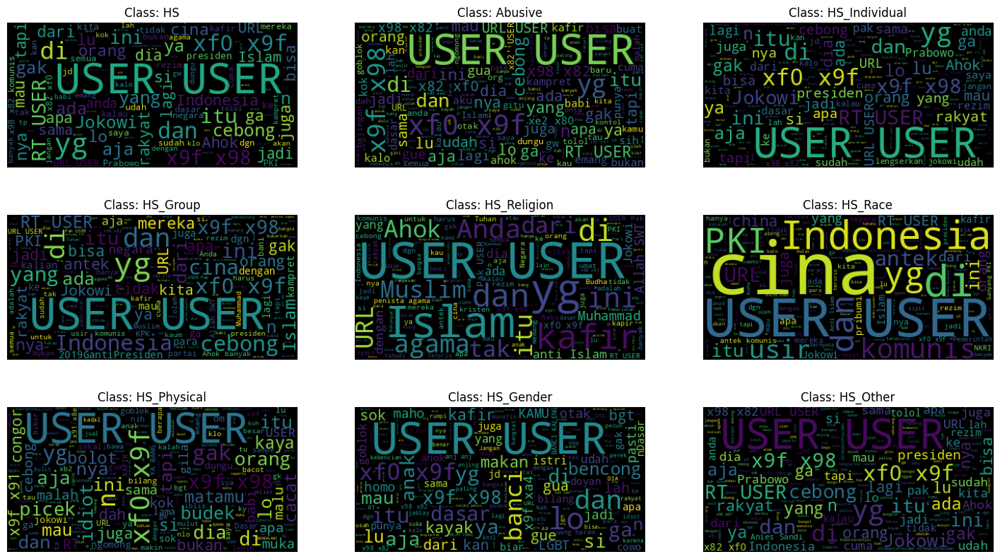

In [10]:
def wordcloud_show(df, col, num_col = 1, start = 1):
  # Label counts
  multilabels = df.iloc[:, start:].columns

  # Subplot grid
  fig, ax = plt.subplots(math.ceil(len(multilabels)/num_col),
                         num_col,
                         figsize =(18, 10))
  # Show subplot
  ax = ax.flatten()
  for i, label in enumerate(multilabels):
    x = df[df[label] == 1][col]
    fig = WordCloud().generate_from_text(' '.join(x))
    ax[i].imshow(fig)
    ax[i].axis("off")
    ax[i].set_title(f"Class: {label}")

  # Hide unused subplot(s)
  for j in range(i + 1, len(ax)):
        fig.delaxes(ax[j])

wordcloud_show(df1, 'Tweet', 3)

###Text Cleansing

In [7]:
def fix_slang(text):
  text = re.sub(r'\blu\b', 'kamu', text)
  text = re.sub(r'\blo\b', 'kamu', text)
  text = re.sub(r'\butk\b', 'untuk', text)
  text = re.sub(r'\bklo\b', 'kalau', text)
  text = re.sub(r'\byg\b', 'yang', text)
  text = re.sub(r'\bgue\b', 'aku', text)
  text = re.sub(r'\bgua\b', 'aku', text)
  text = re.sub(r'\bgw\b', 'aku', text)
  text = re.sub(r'\bad\b', 'ada', text)
  text = re.sub(r'\bya\b', 'iya', text)
  text = re.sub(r'\bsy\b', 'saya', text)
  text = re.sub(r'\bbgt\b', 'banget', text)
  text = re.sub(r'\baja\b', 'saja', text)
  text = re.sub(r'\bga\b', 'tidak', text)
  text = re.sub(r'\bgak\b', 'tidak', text)
  text = re.sub(r'\btdk\b', 'tidak', text)
  text = re.sub(r'\bjd\b', 'jadi', text)
  text = re.sub(r'\bjg\b', 'juga', text)
  text = re.sub(r'\bemg\b', 'emang', text)
  text = re.sub(r'\bjgn\b', 'jangan', text)
  text = re.sub(r'\btp\b', 'tapi', text)
  text = re.sub(r'\bdgn\b', 'dengan', text)
  text = re.sub(r'\bdah\b', 'sudah', text)
  text = re.sub(r'\bsdh\b', 'sudah', text)
  # There is just slang used. If only there is some kind of slang dictionary. I bet there is. However, I am too lazy to find it (but not lazy enogh to code this manually :v)
  return text

# Since I finally decide to use BERT model i don't need all this preprocessing I will leave it here since I need it for the second question
def tekt_cleansing(text):
  # Lower all case
  text = text.lower()

  # Remove not printable/non-ascii
  text = re.sub(r'\\x[a-f0-9]{2}', ' ', text)

  # Remove words starting with \ or #, URLs, and mentions
  text = re.sub(r"'(rt|@|https|\\)\S+\s*", '', text)

  # Remove weird thing
  text = text.replace(r"&lt;/strong&gt;", "").replace(r"&lt;strong&gt;", "")

  # Fix informal language
  text = fix_slang(text)

  rem = ['user', 'si', 'ya', 'sih', 'url', 'nya', 'nih']

  # Non-alphabet character removal
  text = re.sub('[^a-z]', ' ', text)

  # Remove multiple whitespace
  text = ' '.join(text.split())

  # Stopwords Removal
  sw = stopwords.words('indonesian')
  text = ' '.join(word for word in word_tokenize(text)
  if not word in sw and not word in rem)

  return text

def tokenization(text):
  return word_tokenize(text)

def bert_preprocessing(text):
  # Lower all case
  text = text.lower()

  # Remove not printable/non-ascii
  text = re.sub(r'\\x[a-f0-9]{2}', ' ', text)

  # Replace url link with token
  text = re.sub(r'(\$|@|http)\S+\s*', 'HTTPURL', text)
  text = re.sub(r"\burl\b", "HTTPURL", text)

  # Give token to user
  text = re.sub(r"\buser\b", "@USER", text)

  # Remove weird thing
  text = text.replace(r'&lt;/strong&gt;', '')

  # Fix informal language
  text = fix_slang(text)

  # Remove repeated punctuations
  text = re.sub(r'(\W)(?=\1)', ' ', text)

  return ' '.join(text.split())



df1_clean = df1.copy()
col = list(df1_clean.columns)
tweet_index = col.index('Tweet')

df1_clean['clean_text'] = df1_clean['Tweet'].apply(bert_preprocessing)
df1_clean['token'] = df1_clean['clean_text'].apply(tokenization)

col.insert(tweet_index + 1, 'clean_text')
col.insert(tweet_index + 2, 'token')
df1_clean = df1_clean[col]

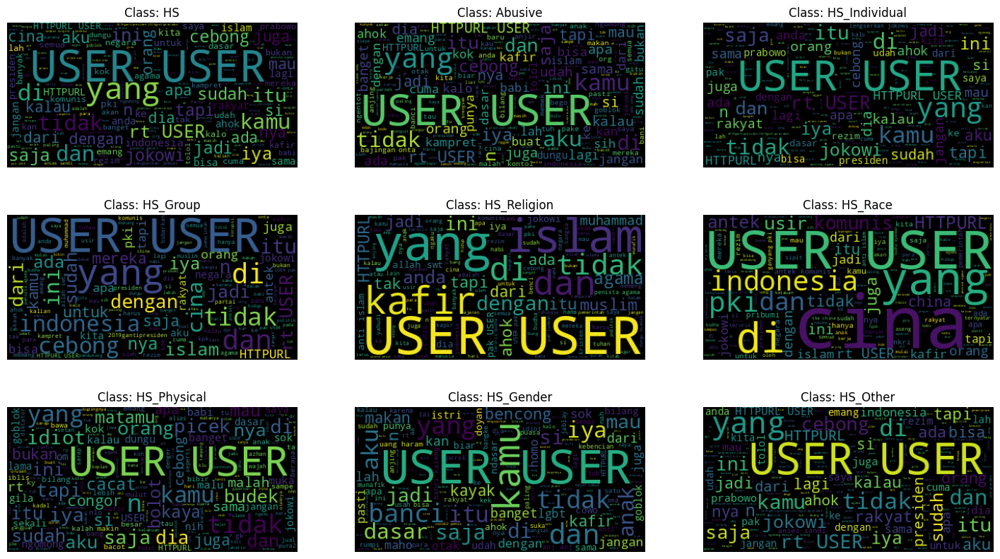

In [12]:
wordcloud_show(df1_clean, 'clean_text', 3, 3)

###Second Phase Data Cleansing

In [13]:
print((df1_clean['clean_text'] == '').sum())
print(df1_clean['clean_text'].duplicated().sum())

0
13


In [14]:
df1_clean2 = df1_clean.copy()
df1_clean2 = df1_clean2[df1_clean2['clean_text'].duplicated() == False]
df1_clean2 = df1_clean2[df1_clean2['clean_text'] != '']

###Data Splitting

In [15]:
df1_clean3 = Dataset.from_pandas(df1_clean2,
                                 preserve_index = False)
df_train_test = df1_clean3.train_test_split(test_size = 0.3,
                                            seed = SEED)
df_test_val = df_train_test['test'].train_test_split(test_size = 0.3,
                                                     seed = SEED)
df_train_test_val = DatasetDict({
    'train' : df_train_test['train'],
    'test'  : df_test_val['test'],
    'val' : df_test_val['train']})

##a.
Bangunlah model klasifikasi dengan menggunakan Large Language Model (LLM), anda dapat menggunakan pretrained model yang akan anda jelaskan pada penjelasan dengan melakukan minimal 2 hyperparameter tuning.

In [16]:
labels = list(df_train_test_val['train'].features.keys())[1:]
label2id = {label : i for i, label in enumerate(labels)}
id2label = {i : label for label, i in label2id.items()}

Since the tweeter data is in Indonesia and my name is Albert, I decide to use BERT model that specialized in Indonesian, indoBERT. I use the large model with around 335.2M parameters. To use this model is very easy, you just need to follow what they told you to code and foila you get the model. However, I also do some modification on my own, just to try something.

In [34]:
tokenizer = AutoTokenizer.from_pretrained('indobenchmark/indobert-large-p1')

def model_maker(series):
  return AutoModelForSequenceClassification.from_pretrained(series,
                                                     problem_type = 'multi_label_classification',
                                                     num_labels = len(labels),
                                                     label2id = label2id,
                                                     id2label = id2label)

BERT_model = model_maker('indobenchmark/indobert-large-p1')

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at indobenchmark/indobert-large-p1 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [18]:
def albert(df):
  enc = tokenizer(df['Tweet'],
                  padding = 'max_length',
                  max_length = 512,
                  truncation = True)
  ln = len(labels)
  l = [0. for i in range(ln)]

  for i in labels:
    if df[i] == 1:
      l[label2id[i]] = 1.

  enc['labels'] = l
  return enc

df_bert_token = df_train_test_val.map(albert,
                                      remove_columns = ['Tweet'] + labels)
data_coll = DataCollatorWithPadding(tokenizer = tokenizer)

Map:   0%|          | 0/2295 [00:00<?, ? examples/s]

Map:   0%|          | 0/296 [00:00<?, ? examples/s]

Map:   0%|          | 0/688 [00:00<?, ? examples/s]

In [35]:
metrics = evaluate.combine(['accuracy',
                            'f1',
                            'precision',
                            'recall'])

def sigmoid(x):
   return 1/(1 + np.exp(-x))

def compute_metrics(eval_pred):
   pred, labels = eval_pred
   pred = sigmoid(pred)
   pred = (pred> 0.5).astype(int).reshape(-1)
   return metrics.compute(pred, labels.astype(int).reshape(-1))

args1 = TrainingArguments(output_dir = "train_llm_1",
                          learning_rate = 1e-5,
                          per_device_train_batch_size = 5,
                          per_device_eval_batch_size = 5,
                          num_train_epochs = 4,
                          weight_decay = 0.01,
                          evaluation_strategy = "epoch",
                          save_strategy = "epoch",
                          load_best_model_at_end = True)

trainer = Trainer(model = BERT_model,
                  args = args1,
                  train_dataset = df_bert_token['train'],
                  eval_dataset =df_bert_token['val'],
                  tokenizer = tokenizer,
                  data_collator = data_coll,
                  compute_metrics = compute_metrics,
)

In [20]:
trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,No log,0.202008,0.919794,0.697257,0.764770,0.640697
2,0.281800,0.170227,0.938821,0.772928,0.831224,0.722273
3,0.160900,0.164047,0.941068,0.790414,0.810993,0.770852
4,0.110600,0.165637,0.941332,0.789573,0.817468,0.763520


TrainOutput(global_step=1836, training_loss=0.16640095617256911, metrics={'train_runtime': 3116.8782, 'train_samples_per_second': 2.945, 'train_steps_per_second': 0.589, 'total_flos': 8555390069207040.0, 'train_loss': 0.16640095617256911, 'epoch': 4.0})

In [25]:
trainer.evaluate(df_bert_token['val'])

{'eval_loss': 0.16404682397842407,
 'eval_accuracy': 0.9410676532769556,
 'eval_f1': 0.7904135338345866,
 'eval_precision': 0.81099324975892,
 'eval_recall': 0.770852428964253,
 'eval_runtime': 62.6262,
 'eval_samples_per_second': 10.986,
 'eval_steps_per_second': 2.204,
 'epoch': 4.0}

In [26]:
trainer.evaluate(df_bert_token['test'])

{'eval_loss': 0.1876363754272461,
 'eval_accuracy': 0.9284398034398035,
 'eval_f1': 0.7629704984740591,
 'eval_precision': 0.7894736842105263,
 'eval_recall': 0.7381889763779528,
 'eval_runtime': 26.5516,
 'eval_samples_per_second': 11.148,
 'eval_steps_per_second': 2.26,
 'epoch': 4.0}

###Tuning
Some of the hyperparameter tuned include learning rate, batch size (train and validation), epoch, and weight decay.

In [36]:
BERT_model2 = model_maker('indobenchmark/indobert-large-p1')

args2 = TrainingArguments(output_dir = "train_llm_2",
                          learning_rate = 5e-5,
                          per_device_train_batch_size = 8,
                          per_device_eval_batch_size = 8,
                          num_train_epochs = 3,
                          weight_decay = 0.03,
                          evaluation_strategy = "epoch",
                          save_strategy = "epoch",
                          load_best_model_at_end = True)

trainer2 = Trainer(model = BERT_model2,
                   args = args2,
                   train_dataset = df_bert_token['train'],
                   eval_dataset =df_bert_token['val'],
                   tokenizer = tokenizer,
                   data_collator = data_coll,
                   compute_metrics = compute_metrics)

trainer2.train()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at indobenchmark/indobert-large-p1 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,No log,0.176132,0.929704,0.740741,0.790843,0.696609
2,0.203600,0.155266,0.944635,0.797487,0.843558,0.756187
3,0.203600,0.153396,0.947014,0.813575,0.825472,0.802016


TrainOutput(global_step=861, training_loss=0.15201209286502568, metrics={'train_runtime': 2344.4482, 'train_samples_per_second': 2.937, 'train_steps_per_second': 0.367, 'total_flos': 6416542551905280.0, 'train_loss': 0.15201209286502568, 'epoch': 3.0})

In [37]:
trainer2.evaluate(df_bert_token['val'])

{'eval_loss': 0.15339569747447968,
 'eval_accuracy': 0.9470137420718816,
 'eval_f1': 0.8135750813575082,
 'eval_precision': 0.8254716981132075,
 'eval_recall': 0.8020164986251146,
 'eval_runtime': 63.4025,
 'eval_samples_per_second': 10.851,
 'eval_steps_per_second': 1.356,
 'epoch': 3.0}

In [38]:
trainer2.evaluate(df_bert_token['test'])

{'eval_loss': 0.18757474422454834,
 'eval_accuracy': 0.9302825552825553,
 'eval_f1': 0.7713997985901309,
 'eval_precision': 0.7896907216494845,
 'eval_recall': 0.7539370078740157,
 'eval_runtime': 26.5724,
 'eval_samples_per_second': 11.139,
 'eval_steps_per_second': 1.392,
 'epoch': 3.0}

In [39]:
BERT_model3 = model_maker('indobenchmark/indobert-large-p1')

args3 = TrainingArguments(output_dir = "train_llm_2",
                          learning_rate = 7e-5,
                          per_device_train_batch_size = 4,
                          per_device_eval_batch_size = 4,
                          num_train_epochs = 3,
                          weight_decay = 0.02,
                          evaluation_strategy = "epoch",
                          save_strategy = "epoch",
                          load_best_model_at_end = True)

trainer3 = Trainer(model = BERT_model3,
                   args = args3,
                   train_dataset = df_bert_token['train'],
                   eval_dataset =df_bert_token['val'],
                   tokenizer = tokenizer,
                   data_collator = data_coll,
                   compute_metrics = compute_metrics,
)

trainer3.train()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at indobenchmark/indobert-large-p1 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,0.261800,0.188281,0.926665,0.719555,0.801802,0.652612
2,0.155700,0.170729,0.936707,0.778343,0.785981,0.770852
3,0.083400,0.170179,0.942125,0.803939,0.785652,0.823098


TrainOutput(global_step=1722, training_loss=0.15269138256431872, metrics={'train_runtime': 2629.2099, 'train_samples_per_second': 2.619, 'train_steps_per_second': 0.655, 'total_flos': 6416542551905280.0, 'train_loss': 0.15269138256431872, 'epoch': 3.0})

In [40]:
trainer3.evaluate(df_bert_token['val'])

{'eval_loss': 0.17017912864685059,
 'eval_accuracy': 0.9421247357293869,
 'eval_f1': 0.8039391226499552,
 'eval_precision': 0.7856517935258093,
 'eval_recall': 0.8230980751604033,
 'eval_runtime': 69.114,
 'eval_samples_per_second': 9.955,
 'eval_steps_per_second': 2.489,
 'epoch': 3.0}

In [41]:
trainer3.evaluate(df_bert_token['test'])

{'eval_loss': 0.2156444489955902,
 'eval_accuracy': 0.9290540540540541,
 'eval_f1': 0.7763794772507261,
 'eval_precision': 0.7638095238095238,
 'eval_recall': 0.7893700787401575,
 'eval_runtime': 28.7872,
 'eval_samples_per_second': 10.282,
 'eval_steps_per_second': 2.571,
 'epoch': 3.0}

Based on the prediction on the test dataset alone second and third model is comparably the same, with the third model with slightly higher accuracy and the second model with slighly higher f1-score. It is up to you which one do you want to prioritize (maybe you also want to prioritze comparing precision or even recall instead).

Note that I choose model 3 as the best model solely because of the f1-score on test dataset

##b
Paparkan hasil berupa accuracy, precision, recal dan F1 score dari data training, validasi dan testing. Jelaskan informasi apa yang anda peroleh dari hasil ini.

In [1]:
trainer3.evaluate(df_bert_token['val'])

NameError: name 'trainer3' is not defined

In [ ]:
trainer3.evaluate(df_bert_token['val'])

In [ ]:
trainer3.evaluate(df_bert_token['test'])

###Analysis Result
I want to remind that metrics shownt is the average of each label

For the training dataset we get</br>
Accuracy: 97.6%</br>
F1-score: 91.6%</br>
Precision: 93.5%</br>
Recall: 90.7%</br>

The result is obviously good since, well the model is kinda trained to fit into the training dataset.

---

For the validation dataset we get</br>
Accuracy:94.2%</br>
F1-score:80.4%</br>
Precision:78.6%</br>
Recall:82.3%</br>
For validation dataset the result is quite good with almost 95% accuracy and about 80% f1-score. The model is good enought to predict the labelof the tweet. there

---
For the testing dataset we get</br>
Accuracy:92.9%</br>
F1-score:77.6%</br>
Precision:76.4%</br>
Recall:78.9%</br>
The performance for testing dataset is also quite good. There is no big margin between precision and recall (<3%) and the score is obviously quite high for multilabel classification (all metrics >75%)

For all the metrics for all the dataset the precision is always lower than the recall indicating there are more false positive compared to false negative.

##c

Jika anda menggunakan teknik yang kreatif dalam membangun model pada No 1a, anda akan mendapatkan tambahan point 5%

##Analysis
The best model is model 3, with accuracy of 0.9290540540540541, precision of 0.7638095238095238, recall of 0.7893700787401575, and f1-score of 0.7763794772507261.


---


indoBERT is useful pre-trained LLM because we use Indonesian data.

Some improvement that could be done
1. Find some kind of slang dictionary to fix the slang.
2. Instead of removing the unprintable char, find the meaning of each of them and replace them with the best word representing them.
3. BIGGGGGGERRRRR MODEL IS GOOD. Find some model with > 1b parameter.
4. Use stemmer from Sastrawi if you want, I just find it to long to wait for the stemmer to do its job.



#2
Di tahun 2023 terjadi kasus BSI yang mengalami serangan Ransomware, sehingga menggangu fungsi Bank ini secara nasional. Pengguna twitter (X) banyak mengunggah tweet memberikan respon terhadap kasus ini. Penasaran dengan apa saja yang dibicarakan user mengenai kasus ini di twitter (X), anda diminta melakukan pemodelan terhadap data kumpulan tweet pengguna dengan detail sebagai berikut:


In [3]:
df2 = pd.read_csv('data_2A.csv')
df2

,Unnamed: 0,index,URL,Date,Tweet,ID,Username,Replies,Reetweets,Likes,Quotes,conversationId,Language,Links,Media,Retweeted Tweet,Bookmarks
0,0,20245,https://twitter.com/joann_aph/status/165623854...,2023-05-10 10:03:36+00:00,@bankbsi_id besok tutup ajalah masa maintenanc...,1656238548792807424,joann_aph,2,0,0,0,1656238548792807424,in,NaN,NaN,NaN,0
1,1,5310,https://twitter.com/PartaiSocmed/status/165760...,2023-05-14 04:50:13+00:00,@win2_winner @bankbsi_id @HaloBCA @BANKBRI_ID ...,1657609236870836226,PartaiSocmed,7,0,2,3,1657601388443049986,in,NaN,NaN,NaN,0
2,2,19500,https://twitter.com/reeeezki/status/1656266869...,2023-05-10 11:56:08+00:00,"@bankbsi_id udahan dong erornya, udah berapa h...",1656266869337391104,reeeezki,0,0,0,0,1656266869337391104,in,NaN,NaN,NaN,0
3,3,9567,https://twitter.com/farid_wajdi70/status/16572...,2023-05-13 06:03:43+00:00,Semoga segera ada solusi terbaik @YLKI_ID @ojk...,1657265343776325633,farid_wajdi70,0,0,0,0,1657265343776325633,in,NaN,NaN,NaN,0
4,4,10154,https://twitter.com/rudinosaurs/status/1657236...,2023-05-13 04:09:45+00:00,@secgron @bankbsi_id Udah lama gw tinggalin ni...,1657236663972802565,rudinosaurs,0,0,1,0,1657192354829451264,in,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6095,6095,19049,https://twitter.com/babybyun1485/status/165628...,2023-05-10 13:10:25+00:00,"@bankbsi_id udah 3hari loh, atm+mbanking berma...",1656285563878793217,babybyun1485,0,0,0,0,1656285563878793217,in,NaN,https://pbs.twimg.com/media/FvxO8JWaQAEa0uu?fo...,NaN,0
6096,6096,15251,https://twitter.com/SHaspida/status/1656547924...,2023-05-11 06:32:56+00:00,@bankbsi_id sampai kapan nih M banking nya tid...,1656547924011253763,SHaspida,3,1,0,1,1656547924011253763,in,NaN,NaN,NaN,0
6097,6097,2992,https://twitter.com/lstynida/status/1658286766...,2023-05-16 01:42:29+00:00,@nmonarizqa @bankbsi_id tuh baca baik2,1658286766712037378,lstynida,0,0,0,0,1658265000136568832,in,NaN,NaN,NaN,0
6098,6098,6832,https://twitter.com/fotbidden/status/165743589...,2023-05-13 17:21:26+00:00,@kepolukekdoraaa @gorengapi @bankbsi_id dicek ...,1657435899263856645,fotbidden,0,0,0,0,1656650251640672269,in,NaN,NaN,NaN,0


##Data Preprocessing

In [4]:
# Data's information summary
df2.info()
df2.describe(include = 'all')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6100 entries, 0 to 6099
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       6100 non-null   int64  
 1   index            6100 non-null   int64  
 2   URL              6100 non-null   object 
 3   Date             6100 non-null   object 
 4   Tweet            6100 non-null   object 
 5   ID               6100 non-null   int64  
 6   Username         6100 non-null   object 
 7   Replies          6100 non-null   int64  
 8   Reetweets        6100 non-null   int64  
 9   Likes            6100 non-null   int64  
 10  Quotes           6100 non-null   int64  
 11  conversationId   6100 non-null   int64  
 12  Language         6100 non-null   object 
 13  Links            220 non-null    object 
 14  Media            555 non-null    object 
 15  Retweeted Tweet  0 non-null      float64
 16  Bookmarks        6100 non-null   int64  
dtypes: float64(1),

,Unnamed: 0,index,URL,Date,Tweet,ID,Username,Replies,Reetweets,Likes,Quotes,conversationId,Language,Links,Media,Retweeted Tweet,Bookmarks
count,6100.000000,6100.000000,6100,6100,6100,6.100000e+03,6100,6100.000000,6100.000000,6100.000000,6100.000000,6.100000e+03,6100,220,555,0.0,6100.000000
unique,NaN,NaN,6100,6055,6095,NaN,4546,NaN,NaN,NaN,NaN,NaN,13,203,554,NaN,NaN
top,NaN,NaN,https://twitter.com/joann_aph/status/165623854...,2023-05-10 10:03:36+00:00,@bankbsi_id cek dm,NaN,refunwd,NaN,NaN,NaN,NaN,NaN,in,http://tinyurl.com/haifreya,https://pbs.twimg.com/media/FvrSXnCaEAIP1PB?fo...,NaN,NaN
freq,NaN,NaN,1,2,4,NaN,40,NaN,NaN,NaN,NaN,NaN,6069,4,2,NaN,NaN
mean,3049.500000,12207.703279,NaN,NaN,NaN,1.657028e+18,NaN,1.140984,0.750492,2.807869,0.194754,1.656693e+18,NaN,NaN,NaN,NaN,0.136393
std,1761.062653,7012.753809,NaN,NaN,NaN,7.948231e+14,NaN,4.406928,28.745128,90.919612,2.469112,3.813335e+15,NaN,NaN,NaN,NaN,5.762908
min,0.000000,1.000000,NaN,NaN,NaN,1.655862e+18,NaN,0.000000,0.000000,0.000000,0.000000,1.425056e+18,NaN,NaN,NaN,NaN,0.000000
25%,1524.750000,6139.500000,NaN,NaN,NaN,1.656318e+18,NaN,0.000000,0.000000,0.000000,0.000000,1.656130e+18,NaN,NaN,NaN,NaN,0.000000
50%,3049.500000,12239.500000,NaN,NaN,NaN,1.656899e+18,NaN,0.000000,0.000000,0.000000,0.000000,1.656642e+18,NaN,NaN,NaN,NaN,0.000000
75%,4574.250000,18304.750000,NaN,NaN,NaN,1.657542e+18,NaN,1.000000,0.000000,0.000000,0.000000,1.657217e+18,NaN,NaN,NaN,NaN,0.000000


In [5]:
#Duplicated data
df2_clean = df2[['Tweet']].copy().drop_duplicates()

##Text Cleansing

In [8]:
def text_cleansing2(text):
  rem = ['id', 'https', 'bankbsi']

  # Remove multiple whitespace
  return ' '.join(word for word in word_tokenize(text)
                    if not word in rem)

df2_clean['clean_text'] = df2_clean['Tweet'].apply(tekt_cleansing)
df2_clean['clean_text'] = df2_clean['clean_text'].apply(text_cleansing2)
df2_clean['token'] = df2_clean['clean_text'].apply(tokenization)
df2_clean = df2_clean[['Tweet', 'clean_text', 'token']]

##Word Representation

In [9]:
vectorizer = TfidfVectorizer()
df2_tfidf = vectorizer.fit_transform(df2_clean['clean_text'])
train_tfidf = pd.DataFrame(df2_tfidf.toarray(),
                           columns = vectorizer.get_feature_names_out())
train_tfidf

,aa,aaaa,aaaaaaaaaa,aag,aahhh,aaja,aalamiin,aamiin,aan,aanfr,aanndtrr,aapalagi,aarav,aardimuzaki,aatulee,ab,ababil,abadi,abaikan,abal,abang,abangku,abangkuuuu,abasement,abbas,abda,abdc,abdya,abecelimadasaar,abeln,abibaikbaik,abidin,abimanyu,abique,abis,abisss,abta,abu,abuandrizal,abumundzir,abuzain,abwwgld,abysynclair,ac,acak,acan,acara,acc,accdount,account,accountmu,accsutan,aceh,achipparah,achmadfauzan,achmadi,achsa,acikjcr,acil,action,activasi,actor,actornya,acunalykfg,adaa,adaha,adahal,adakah,adam,adamsrose,adbk,address,adduuhh,ade,adearmando,adecobrajr,adefai,adek,adekkk,adem,adhimid,adhityoagam,adi,adidwijayadi,adikku,adiku,adikun,adinda,adindha,adisucipto,adithtatts,adityatrd,adiwarman,adji,adjiefaisa,adkun,adlh,adm,admin,admind,adminn,adminnya,adorebeel,adprtt,adri,adrianosoko,adro,adtmwashere,aduh,aduhh,aduhhh,adut,aduuuh,aduuuhh,advice,adym,adzan,ae,aelaah,aelah,aer,aerinicha,aertifakate,aestheit,aeyhb,aeyujikarin,af,afaik,afandi,afb,afiffuads,afinnur,afmardani,afrizalmawardi,after,aftersalesservice,ag,aga,again,agama,agaragar,agata,agbvqmomhd,agcrisbp,agen,agenda,agent,agha,aghzhaf,agixdota,agnajr,agnolios,agoengnasrulloh,agogoid,agokcs,agree,agricom,agricomipb,agun,agunan,agung,agunxkhaqq,agus,agusfiyast,aguspriyadi,agwmyzhv,ah,ahad,ahaha,ahgaharu,ahgasi,ahh,ahhh,ahli,ahmad,ahmadgozali,ahmadrizaljamha,ai,aia,aib,aibnya,aidhanofita,aidzin,aifzvxhe,aing,aingg,ainiihanum,ainunnajib,aiprotocol,air,airyay,ais,aisyah,aisye,aitpdcj,aiueoraib,aiza,aj,ajaa,ajaaa,ajaaaaa,ajaah,ajah,ajaha,ajaib,ajak,ajakan,ajalagi,ajalah,ajarin,ajasih,aje,ajg,ajh,aji,ajiees,ajiksip,ajj,ajotsszqcu,ajrawrrrr,ajukan,ak,akad,akademik,akadnya,akal,akases,akbar,akeh,akg,akhi,akhirat,akhirnyaaa,akhirnyaaaaaa,akhlak,akibat,akibatnya,akmalhars,akronim,akses,aksesnya,aksess,aksi,aksiladrif,aksinya,aktif,aktifin,aktifitas,aktifkan,aktifvasi,aktivasi,aktivasinya,aktivitas,aktor,akuabbas,akuameliar,akuatikafaya,akui,akuimuts,akuin,akun,akunan,akunnya,akunya,akupun,akurat,akutu,akuu,akuw,al,ala,alaamakannyaapa,aladin,alahh,alaikum,alaikumsalam,alaikumussalam,alam,alamak,alamat,alami,alamsyahferda,alaqom,alasan,alasannya,alatnya,albabannas,alberhal,albert,albertsolo,alcdltp,aldi,alert,alesan,alesanku,alesannya,alessandro,aleumdaeeum,alexander,alfamart,algifari,alhamdlulilah,alhamdulilaah,alhamdulilah,alhamdulillaah,alhamdulillaahirobbil,alhamdulillah,alhamdulillahnya,alhamdullilah,alharits,alhasil,alhmdllah,alhmdulillah,alialhinduan,alias,aliassss,alibi,alice,alih,alihkan,alimran,aliszhra,alka,all,allaahhhhhh,allaboutedi,allah,allahhhh,allahu,allahul,allahuuuuj,allegry,allhamdulilah,allightknite,allo,allobank,alloh,allyavyn,alm,almanarrahman,almeerabz,alqaby,already,alternatif,altiana,alumni,alvainata,alvanmaoelana,alvarendrarenzo,alvarez,alves,alvinomarcopolo,alwafymamuli,alyasavira,am,ama,amahnurul,amahuman,amal,amalagendaa,amalia,aman,amanah,amanahnya,amanda,amandarahayu,amanin,amankah,amankan,amannya,amarta,amatir,amatiran,amazeeng,ambil,amburadul,ambyar,amdjew,amedeussmozart,amelyahdyh,amerika,amici,amigyue,amin,amit,ammmmmmmmani,amna,amnwtltifh,amp,ampas,ampasnya,ampe,ampee,ampek,amplop,ampum,ampun,ampunbanghilal,ampunn,ampunnn,ampuuun,ampuuunn,ampuuunnnnn,amri,amriyantinada,amrullahdzaky,amsyong,amxchrkokq,an,anak,anakebapakusi,anaknya,anakpisangan,anakposer,anaksaka,anakuniqlo,analis,analisa,analisis,analogi,anang,anaqqmamie,anas,anastasiacachaa,ancam,ancaman,ancur,and,andai,andalkan,andamaslyta,andaterdiam,andemha,andiazhar,andiiprtma,andika,andil,andinaap,andjar,andreasnicko,andrekelv,andremirza,andriahfaa,andriana,andriangalaghe,andrianrpratama,andrie,andriyan,andro,android,androind,andromedaa,andy,andyfauzi,ane,aneh,anetta,anfield,anfieldbreath,anfieldmart,ang,angahraul,angel,anggap,anggaran,angger,anggota,anggradewi,anggraendhell,anggraeni,angka,angkanya,angkat,angkatan,angkot,angless,angranggi,angsuran,angsurannya,anies,aniesbaswedan,aniesmania,anime,anisaaf,anisahyumhans,anj,anjas,anjay,anjelieca,anjeng,anjer,anjg,anjggggg,anjing,anjink,anjir

In [10]:
train_tfidf.columns

Index(['aa', 'aaaa', 'aaaaaaaaaa', 'aag', 'aahhh', 'aaja', 'aalamiin',
       'aamiin', 'aan', 'aanfr',
       ...
       'zwbdhx', 'zwdxiiwa', 'zwhzq', 'zxcasdqwe', 'zydzsskoxd', 'zzg',
       'zzptxsgd', 'zzz', 'zzzz', 'zzzzz'],
      dtype='object', length=12114)

##a
Lakukan pengelompokan dengan menggunakan pendekatan clustering, silahkan ujicoba beberapa nilai cluster (k) yang mungkin anda peroleh dari data tersebut, berikan perbandingan silhoutte score sebagai justifikasi jumlah cluster (k) yang akan anda pilih.

In [11]:
cluster_range = range(2, 9)

km = [KM(n_clusters = i,
        random_state = SEED,
        n_init='auto').fit(train_tfidf) for i in cluster_range]

# inertias and silhouette scores
km_inertias = [model.inertia_ for model in km]
silhouette_scores = [SS(train_tfidf, model.labels_) for model in km]

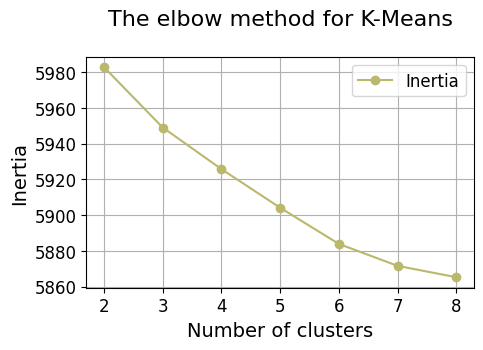

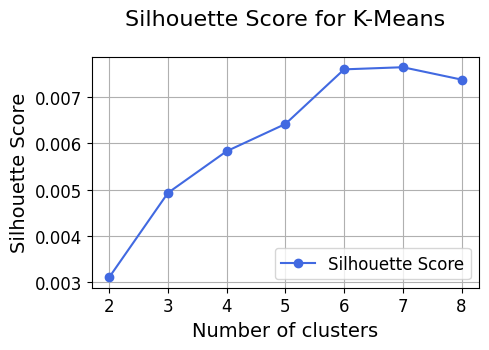

In [12]:
# Plot Inertia
plt.figure(figsize = (5, 3))
plt.plot(cluster_range,
         km_inertias,
         'o-',
         label = 'Inertia',
         color = '#BAB86C')
plt.title('The elbow method for K-Means\n', fontsize = 16)
plt.xlabel('Number of clusters', fontsize = 14)
plt.ylabel('Inertia', fontsize = 14)
plt.xticks(cluster_range, fontsize = 12)
plt.yticks(fontsize = 12)
plt.grid(True)
plt.legend(loc='upper right', fontsize = 12)
plt.show()

# Plot Silhouette Score
plt.figure(figsize = (5, 3))
plt.plot(cluster_range, silhouette_scores,
         'o-',
         label = 'Silhouette Score',
         color = '#4169E1')
plt.title('Silhouette Score for K-Means\n', fontsize = 16)
plt.xlabel('Number of clusters', fontsize = 14)
plt.ylabel('Silhouette Score', fontsize = 14)
plt.xticks(cluster_range, fontsize = 12)
plt.yticks(fontsize = 12)
plt.grid(True)
plt.legend(loc = 'lower right', fontsize = 12)
plt.show()

##b
Lakukan persona analysis untuk cluster yang anda hasilkan, jelaskan informasi yang anda peroleh mengenai cluster tersebut berdasarkan personanya.

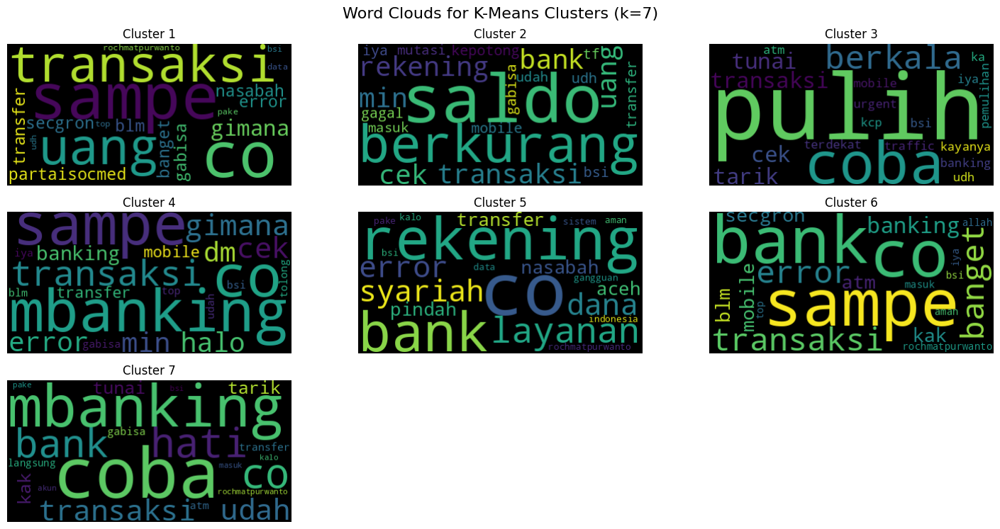

In [13]:
# Determine the best k based on silhouette score
best_k_index = silhouette_scores.index(max(silhouette_scores))
best_model = km[best_k_index]
best_k = cluster_range[best_k_index]

plt.figure(figsize = (15, 10))
for cluster in range(best_k):
  plt.subplot(4, 3, cluster + 1)
  cluster_words = set()
  top_features_idx = best_model.cluster_centers_[cluster].argsort()[::-1][:20]  # Get top 20 features
  for idx in top_features_idx:
      cluster_words.add(vectorizer.get_feature_names_out()[idx])
  cluster_words_str = ' '.join(cluster_words)
  wordcloud = WordCloud().generate(cluster_words_str)
  plt.imshow(wordcloud, interpolation = 'bilinear')
  plt.title(f'Cluster {cluster + 1}')
  plt.axis('off')

plt.suptitle(f'Word Clouds for K-Means Clusters (k={best_k})', fontsize=16)
plt.tight_layout()
plt.show()

In [14]:
for cluster in range(best_k):
  print(f"\nCluster {cluster + 1}:")
  top_features_idx = best_model.cluster_centers_[cluster].argsort()[::-1][:15]  # Get top 10 features
  top_words = [vectorizer.get_feature_names_out()[idx] for idx in top_features_idx]
  print(', '.join(top_words))


Cluster 1:
rochmatpurwanto, co, secgron, bsi, banget, sampe, error, blm, transfer, udh, transaksi, nasabah, data, uang, gimana

Cluster 2:
saldo, cek, bsi, masuk, transfer, min, transaksi, tf, gagal, udah, rekening, kepotong, berkurang, mutasi, gabisa

Cluster 3:
atm, ka, mobile, bsi, coba, banking, cek, berkala, udh, tarik, tunai, pulih, pemulihan, urgent, traffic

Cluster 4:
min, iya, mobile, bsi, dm, mbanking, gabisa, transfer, co, gimana, sampe, tolong, cek, transaksi, blm

Cluster 5:
bank, bsi, syariah, indonesia, co, nasabah, aceh, pindah, sistem, data, layanan, dana, transfer, rochmatpurwanto, gangguan

Cluster 6:
iya, bsi, kak, bank, mobile, banking, error, secgron, rochmatpurwanto, banget, blm, allah, co, up, masuk

Cluster 7:
udah, kak, coba, bsi, kalo, atm, transaksi, pake, tarik, transfer, masuk, gabisa, bank, mbanking, hati


In [15]:
pd.set_option('display.max_colwidth', None)

for cluster in range(best_k):
  cluster_data_indices = [idx for idx, label in enumerate(best_model.labels_) if label == cluster]
  cluster_head_data = df2['Tweet'].iloc[cluster_data_indices].head(10)
  print(f"\nCluster {cluster + 1}:")
  for tweet in cluster_head_data:
    print(tweet.ljust(100))
  print("\n")

pd.reset_option('display.max_colwidth')


Cluster 1:
@bankbsi_id besok tutup ajalah masa maintenance 3 hari 😡😡😡 mana mobile banking gabisa, tarik tunai gabisa, mana kaga punya cash 😩😩 TRS INI W CARANYA IDUP GMN KALO GAPUNYA DUIT DAN GABISA NGAMBIL DUIT?!
@win2_winner @bankbsi_id @HaloBCA @BANKBRI_ID @MUIPusat Boleh. Selama debat di twitter kami layani, asal jangan minta ketemuan saja
Semoga segera ada solusi terbaik @YLKI_ID @ojkindonesia @bankbsi_id                                 
@IkhtiarKotabumi @bankbsi_id Udh bisa                                                               
@bankbsi_id Ada kompensasi tdk ini? Sebagai bentuk tanggung jawab kepada nasabah yg sudah rugi materi dan perasaan 🤔
@bankbsi_id Pulih dari mananya? Saya sampai sekarang sudah 5 hari tidak bisa mengurus pelunasan di BSI KCP Natuna. Alasan jaringannya gangguan. Klo saya nunggak nyetor beberapa hari ditelpon telpon. Saya mau pelunasan pinjaman sekarang kayak org ngemis2. Mo berapa lama terus begini. 1 bulan?
@bankbsi_id tolong cepat perbaiki aku mau 

###Persona Analysis
Overall the tweet is about customer complains to BSI Bank Service. However, let's dive deeper to know what they are talking about for each cluster.
- Cluster 1:
  - characteristics: Cluster 1 seems to be discussing various issues related to transactions, errors, and customer dissatisfaction. Words like "error", "transfer", "transaksi", "nasabah", and "uang" indicate a focus on problems with banking services, possibly reflecting frustration and complaints about service reliability and customer support.
  - behavior: Highly dissatisfied and vocal about it, seek instant resolution and accountability from BSI.
  - Name: **The entitled one**

- Cluster 2:
  - characteristics: Cluster 2 is centered around balance checking, transactions, and issues related to account management. Words like "saldo", "transaksi", "gagal", "akun", and "mutasi" suggest concerns about transaction failures, deductions, and account discrepancies. Users in this cluster seem focused on the technical aspects of banking operations.
  - behavior: Concerned about financial losses, seeking immediate assistance and clarification on transaction status.
  - Name: **The money lover**

- Cluster 3:
  - characteristics: Cluster 3 discusses issues related to ATM and mobile banking services. Words like "atm", "mobile", "banking", "tarik", "pemulihan", and "urgent" indicate users dealing with service disruptions, recovery processes, and urgent banking needs. This cluster might include customers seeking immediate solutions to service outages.
  - behavior: Frequently checking for service availability, frustrated with prolonged disruptions.
  - Name: **The frustated one**

- Cluster 4:
  - characteristics: Cluster 4 appears to focus on general inquiries and issues related to mobile banking and transactions. Words like "mobile", "banking", "transaksi", "gabisa", "gimana", "tolong", and "cek" suggest users seeking assistance or expressing frustration with banking services and operations.
  - behavior: Continuously checking for updates, experiencing financial stress due to service disruptions.
  - Name: **The desperate one**

- Cluster 5:
  - characteristics: Cluster 5 discusses broader topics related to banking institutions, including Bank BSI and Sharia banking. Words like "bank", "syariah", "nasabah", "pindah", "layanan", "transfer", and "gangguan" indicate discussions about banking systems, customer service experiences, and operational disruptions affecting customers. And also they somehow joke/threaten to switch bank.
  - behavior: Considering switching banks, Experiencing severe disruptions, demanding stability and assurance regarding the safety of their financial information.
  - Name: **The potential missing one**

- Cluster 6:
  - characteristics: Cluster 6 seems to focus on informal interactions and technical issues related to banking services. Words like "mobile", banking" "error", "blm",  "Allah", and "masuk" indicate a mix of technical inquiries, customer support interactions, and possibly community discussions about service reliability.
  - behavior: Frustrated with technical problems, sarcastic and critical of the bank’s handling of maintenance and customer service, Continuously reporting issues, seeking consistent service and effective resolutions to ensure smooth banking operations.
  - Name: **The already give-up one**

- Cluster 7:
  - characteristics: Cluster 7 revolves around discussion how to solve the issue. Words like "udah", "coba", "kalo", "atm", "pake" "gabisa" suggest users are in discussion where some of them may give advice to others.
  - behavior: Sharing personal experiences, offering advice to others, emphasizing caution against potential scams.
  - Name: **The helper**




##c
Anda tertarik untuk membandingkan hasil clustering dengan metode lain yaitu topic extraction, sehingga anda perlu melakukan pemodelan topic extraction. Jelaskan metode topic extraction yang anda lakukan

In [26]:
token = df2_clean['clean_text'].apply(word_tokenize)
dictionary = corpora.Dictionary(token)
corpus = [dictionary.doc2bow(doc) for doc in token]

lda_model = LdaModel(corpus = corpus,
                     num_topics = best_k,
                     id2word = dictionary,
                     passes = 40,
                     random_state = SEED)

# Show main topic
for topic_id, topic_words in lda_model.print_topics():
  # Extract only the words from topic_words
  words = re.findall(r'"([^"]*)"', topic_words)
  print(f"Topic: {topic_id + 1}")
  print(f"Words: {words}")
  print()

Topic: 1
Words: ['bsi', 'saldo', 'min', 'atm', 'transaksi', 'udah', 'mobile', 'banking', 'transfer', 'bank']

Topic: 2
Words: ['bank', 'bsi', 'hati', 'iya', 'syariah', 'akun', 'aceh', 'indonesia', 'kena', 'kak']

Topic: 3
Words: ['ka', 'kak', 'coba', 'bsi', 'iya', 'udah', 'atm', 'mobile', 'berkala', 'kcp']

Topic: 4
Words: ['t', 'co', 'min', 'mas', 'dm', 'transfer', 'tolong', 'gopay', 'va', 'wali']

Topic: 5
Words: ['data', 'nasabah', 'bank', 'bsi', 'secgron', 't', 'syariah', 'co', 'sistem', 'layanan']

Topic: 6
Words: ['iya', 'rochmatpurwanto', 'udah', 'kemarin', 'semoga', 'keterangan', 'tunai', 'belom', 'an', 'scan']

Topic: 7
Words: ['bsi', 'bank', 'banget', 'udah', 'iya', 'pake', 'uang', 'loh', 'kalo', 'error']



##d

Mohon maaf tadi lupa kasih random state buat topic extractionnya. Ini hasil yang saya simpulkan</br>
Topic: 1</br>
Words: ['bsi', 'atm', 'kak', 'ka', 'iya', 'bank', 'coba', 'tarik', 'cek', 'udh']</br>

Topic: 2</br>
Words: ['t', 'co', 'iya', 'min', 'kak', 'masuk', 'tolong', 'transfer', 'udah', 'up']</br>

Topic: 3</br>
Words: ['rochmatpurwanto', 'm', 'banking', 'bsi', 'iya', 'uang', 'transaksi', 'atm', 'ambil', 'transfer']</br>

Topic: 4</br>
Words: ['bank', 'bsi', 'syariah', 't', 'co', 'indonesia', 'secgron', 'data', 'nasabah', 'lockbit']</br>

Topic: 5</br>
Words: ['bsi', 'bank', 'udah', 't', 'saldo', 'co', 'mobile', 'transfer', 'min', 'cek']</br>

Topic: 6</br>
Words: ['bsi', 'bank', 'saldo', 'kalo', 'banget', 'nasabah', 'data', 'iya', 'pake', 'mobile']</br>

Topic: 7</br>
Words: ['wali', 'kena', 'secgron', 'penipu', 'hack', 'wahyufandi', 'ransomware', 'ngeri', 'terimakasih', 'buku']</br>


Lakukan persona analysis kembali untuk topik yang anda peroleh, bandingkan apa yang anda peroleh dari pendekatan clustering dan topic extraction. Paparkan hal-hal menarik yang berhasil anda ekstrak.

###Persona Analysis
- Cluster 1 **(Normies)**: Likely everyday banking activities involving ATM transactions, checking balances, and minor issues or inquiries.
- Cluster 2 **(Help-seeker)**: Users seeking support or assistance regarding specific transactions, transfers, and account management.
- Cluster 3 **(Businessman)**: Discussions centered around financial transactions, possibly withdrawing money from ATM.
- Cluster 4 **(Cyber Victim)**: concerns related to security, possibly related to cybersecurity threats or data security within the banking context. Discussions involve terms like "lockbit" and focus on security issues and data protection.
- Cluster 5 **(Mobile banker)**: Users engaged with mobile banking services, discussing issues related to balances, transfers, and mobile banking functionalities.
- Cluster 6 **(Reviewer)**: Users discussing their overall service experience with the bank.
- Cluster 7 **(Cautious)**:  Users concerned or discussing cybersecurity threats, possibly external threats like phishing or ransomware attacks and also fraudlent. Discussions involve terms related to security threats and awareness, such as "hack", "penipu", and "ransomware."


I think that the topic extraction from lda can give more separtion about the type of tweet compared to the kmeans


#3
Anda memiliki suatu suatu set text (data.3-.txt) yang ingin anda simpulkan dengan bantuan algoritma. Lakukanlah pemodelan text summarization dengan pendekatan extractive dengan menggunakan top 3 and 5 scores untuk masing-masing data. Lakukan evaluasi dengan menggunakan ROUGE score dan jelaskan analisa terhadap hasil summarization yang anda peroleh dan jelaskan pendapat anda mengenai summary yang dihasilkan

In [17]:
df3 = pd.read_csv('data_3A.csv')
df3

,Unnamed: 0,content,summary
0,0,"TEMPO.CO, Jakarta - Anggota Komisi VII DPR RI ...",Anggota Komisi VII DPR RI Rofik Hananto menyay...
1,1,"TEMPO.CO, Jakarta - Presiden Joko Widodo atau ...",Presiden Joko Widodo telah memerintahkan Wakil...
2,2,INFO NASIONAL - Wakil Ketua MPR RI Dr. H. M. H...,Wakil Ketua MPR RI Dr. H. M. Hidayat Nur Wahid...


##Text Preprocessing

In [18]:
df3.info()
df3.describe(include = 'all')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  3 non-null      int64 
 1   content     3 non-null      object
 2   summary     3 non-null      object
dtypes: int64(1), object(2)
memory usage: 200.0+ bytes


,Unnamed: 0,content,summary
count,3.0,3,3
unique,NaN,3,3
top,NaN,"TEMPO.CO, Jakarta - Anggota Komisi VII DPR RI ...",Anggota Komisi VII DPR RI Rofik Hananto menyay...
freq,NaN,1,1
mean,1.0,NaN,NaN
std,1.0,NaN,NaN
min,0.0,NaN,NaN
25%,0.5,NaN,NaN
50%,1.0,NaN,NaN
75%,1.5,NaN,NaN


In [19]:
df3.drop(columns = ['Unnamed: 0'], inplace = True)

In [20]:
def tekt_cleansing3(text):
  # Remove spam phrase
  text = re.sub('TEMPO.CO, Jakarta - ', ' ', text)
  text = re.sub('INFO NASIONAL - ', ' ', text)
  text = re.sub(re.escape('Pilihan Editor:') + r'.*', ' ', text)

  # Remove multiple whitespace
  text = ' '.join(text.split())

  return text

df3_clean = df3.copy()
df3_clean['clean_text'] = df3_clean['content'].apply(tekt_cleansing3)
df3_clean = df3_clean[['content', 'clean_text', 'summary']]

##Summary

In [21]:
def summarize_data(sentences, top_n = 1):
  sentences = sentences.split('.')

  factory = StemmerFactory()
  stemmer = factory.create_stemmer()
  stemmed_sentences = [stemmer.stem(sentence) for sentence in sentences]

  tfidf_vectorizer = TfidfVectorizer()
  tfidf_matrix = tfidf_vectorizer.fit_transform(stemmed_sentences)

  tfidf_matrix = tfidf_matrix.toarray()

  doc_vector = np.sum(tfidf_matrix, axis = 0).reshape(1, -1)

  sentence_scores = cosine_similarity(tfidf_matrix, doc_vector)

  ranked_sentences_idx = np.argsort(sentence_scores.flatten())[-top_n:][::-1]
  ranked_sentences = [sentences[i] for i in ranked_sentences_idx]

  return '.'.join(ranked_sentences)


df3_summary = df3_clean.copy()
df3_summary['summary_top_3'] =  df3_summary['clean_text'].apply(lambda x: summarize_data(x, 3))
df3_summary['summary_top_5'] =  df3_summary['clean_text'].apply(lambda x: summarize_data(x, 5))
df3_summary = df3_summary[['content',
                          'clean_text',
                          'summary_top_3',
                          'summary_top_5',
                          'summary']]
df3_summary

,content,clean_text,summary_top_3,summary_top_5,summary
0,"TEMPO.CO, Jakarta - Anggota Komisi VII DPR RI ...",Anggota Komisi VII DPR RI Rofik Hananto menyay...,Pertamina harus benahi sistem pengamanan dan ...,Pertamina harus benahi sistem pengamanan dan ...,Anggota Komisi VII DPR RI Rofik Hananto menyay...
1,"TEMPO.CO, Jakarta - Presiden Joko Widodo atau ...",Presiden Joko Widodo atau Jokowi memerintahkan...,Kebakaran besar di lokasi tersebut terjadi pa...,Kebakaran besar di lokasi tersebut terjadi pa...,Presiden Joko Widodo telah memerintahkan Wakil...
2,INFO NASIONAL - Wakil Ketua MPR RI Dr. H. M. H...,Wakil Ketua MPR RI Dr. H. M. Hidayat Nur Wahid...,Wakil Ketua MPR Hidayat Nur Wahid menyampaikan...,Wakil Ketua MPR Hidayat Nur Wahid menyampaikan...,Wakil Ketua MPR RI Dr. H. M. Hidayat Nur Wahid...


##ROUGE Score

In [22]:
def rouge(df):
  scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'])
  scores_top_3 = []
  scores_top_5 = []

  for idx, row in df.iterrows():
    summary = row['summary']
    summary_top_3 = row['summary_top_3']
    summary_top_5 = row['summary_top_5']

    score_top_3 = scorer.score(summary, summary_top_3)
    score_top_5 = scorer.score(summary, summary_top_5)
    scores_top_3.append(score_top_3)
    scores_top_5.append(score_top_5)

  df['rouge1_scores_top_3'] = [score['rouge1'].fmeasure for score in scores_top_3]
  df['rouge2_scores_top_3'] = [score['rouge2'].fmeasure for score in scores_top_3]
  df['rougeL_scores_top_3'] = [score['rougeL'].fmeasure for score in scores_top_3]
  df['rouge1_scores_top_5'] = [score['rouge1'].fmeasure for score in scores_top_5]
  df['rouge2_scores_top_5'] = [score['rouge2'].fmeasure for score in scores_top_5]
  df['rougeL_scores_top_5'] = [score['rougeL'].fmeasure for score in scores_top_5]

  return df

df3_summary = rouge(df3_summary)

In [24]:
for i, (r13,
        r15,
        r23,
        r25,
        rl3,
        rl5) in enumerate(zip(df3_summary['rouge1_scores_top_3'],
                              df3_summary['rouge1_scores_top_5'],
                              df3_summary['rouge2_scores_top_3'],
                              df3_summary['rouge2_scores_top_5'],
                              df3_summary['rougeL_scores_top_3'],
                              df3_summary['rougeL_scores_top_5'])):
  if r13 is not None and r23 is not None and rl3 is not None:
    print(f'ROUGE-1 score for sentence {i+1} (Top 3): {r13}')
    print(f'ROUGE-1 score for sentence {i+1} (Top 5): {r15}\n')

    print(f'ROUGE-2 score for sentence {i+1} (Top 3): {r23}')
    print(f'ROUGE-2 score for sentence {i+1} (Top 5): {r25}\n')

    print(f'ROUGE-L score for sentence {i+1} (Top 3): {rl3}')
    print(f'ROUGE-L score for sentence {i+1} (Top 5): {rl5}')
    print('\n==========================================================\n')

ROUGE-1 score for sentence 1 (Top 3): 0.13999999999999999
ROUGE-1 score for sentence 1 (Top 5): 0.27586206896551724

ROUGE-2 score for sentence 1 (Top 3): 0.020408163265306124
ROUGE-2 score for sentence 1 (Top 5): 0.18181818181818182

ROUGE-L score for sentence 1 (Top 3): 0.08
ROUGE-L score for sentence 1 (Top 5): 0.2482758620689655


ROUGE-1 score for sentence 2 (Top 3): 0.7755102040816326
ROUGE-1 score for sentence 2 (Top 5): 0.5629629629629629

ROUGE-2 score for sentence 2 (Top 3): 0.7291666666666667
ROUGE-2 score for sentence 2 (Top 5): 0.5263157894736843

ROUGE-L score for sentence 2 (Top 3): 0.40816326530612246
ROUGE-L score for sentence 2 (Top 5): 0.34074074074074073


ROUGE-1 score for sentence 3 (Top 3): 0.49090909090909085
ROUGE-1 score for sentence 3 (Top 5): 0.35526315789473684

ROUGE-2 score for sentence 3 (Top 3): 0.4444444444444444
ROUGE-2 score for sentence 3 (Top 5): 0.32

ROUGE-L score for sentence 3 (Top 3): 0.49090909090909085
ROUGE-L score for sentence 3 (Top 5): 0

##Analysis
**Text 1**
- Top 3: This summary emphasize that Pertamina need to fix their SOP and their security.
- Top 5: To add more to the top 3. This summary also add more information that TBBM Plumpang is one of the significant asset in Indonesia. We can infer that something is happening (the fire incident) to it.

the first and second sentence talk about the same thing and we can remove one of them. The text summarization should also talk about what was happening (the fire incident).

**Text 2**
- Top 3: The second sentence is unnecessarry as it is the same as the first sentence. This talk about what happens and the vice president is ordered to investigate the incident.
- Top 5:  To add more to the top 3. it provides good summary because it doesn't miss a lot of detail, as much as of  the top 3.
maybe we can add ""Penyebab kejadian masih dalam proses investigasi," kata Area Manager Communication, Relation & CSR Pertamina Patra Niaga Regional Jawa Bagian Barat Eko Kristiawan" as one of the top 3, to replace the second sentence, since it tells that the cause of the incident is unknown.

**Text 3**
- Top 3: This has explained enough about the text.
- Top 5: The fifth sentence is the paraphrase of the fourth sentence

maybe we can add "Delegasi Paguyuban First Travel Indonesia dipimpin Abdul Rasyid SIQ, S. Thi, M.Si., Salah satu tujuan Kedatangan perwakilan mereka bertemu HNW, adalah untuk meminta bantuan dan dukungan terkait Putusan Kasasi Mahkamah Agung Nomor: 365 PK/Pid.Sus/2022 tanggal 23 Mei 2022.Dalam PK, itu Mahkamah Agung (MA) memutuskan bahwa seluruh aset dalam kasus PT First Anugerah Karya Wisata (First Travel) dikembalikan ke jamaah atau korban" as it tells exactly what happened.



---

First things first, Let's know about the rouge scores
ROUGE (Recall-Oriented Understudy for Gisting Evaluation) scores are used to evaluate the quality of text summarization. The key metrics are:

* ROUGE-1: Measures the overlap of unigrams (single words) between the algorithm summary and the reference summary.
* ROUGE-2: -//- bigrams (two-word sequences) -//-
* ROUGE-L: Measures the longest common subsequence -//-

Here are a few things that I could analyze from the ROUGE score result
1. For all sentences, the scores generally decrease when moving from the top 3 to the top 5 sentences, suggesting that more concise summaries (top 3) are often better aligned with the reference summaries than longer ones (top 5).
2. Second Sentence consistently shows the highest scores across all metrics, indicating it is the most accurately summarized. This may suggest that it is easier to summarize or maybe that the summarization model performs better for this type of content. Or maybe that the text is just longer, who knows.
3. The ROUGE-2 scores are generally lower than ROUGE-1 scores, highlighting the challenge of capturing accurate bigram sequences. This suggests room for improvement in capturing the context and sequence of the text.
4. The ROUGE-L scores, while also higher for the top 3 sentences, provide a good indication of the model's ability to capture the longest common subsequence. This metric's lower scores compared to ROUGE-1 reinforce the observation that sequence matching is a challenge.

Just to be fair, I don't think that the reference summary is doing any good either because It doesn't capture all the important information from the content, so yeah...
